# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

# Student : Zakaria AKIL

In [142]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


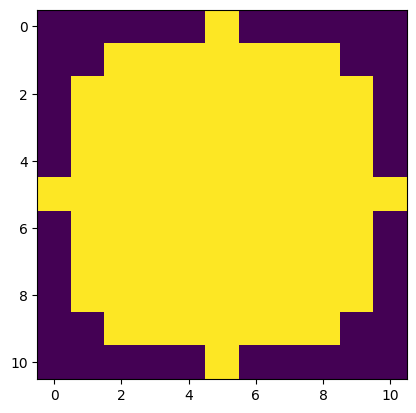

In [143]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]


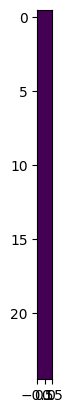

In [144]:
def line_strell(width,length):
  if student :
    strell = np.ones((length, width), dtype=int)
  return strell

strell = line_strell(1,25)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

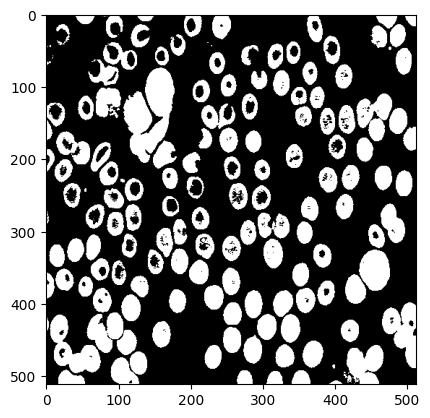

In [145]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/images/cell.tif")
  img
  seuil = 150
  image_binaire = np.where(img < seuil, 1, 0)
  plt.imshow(image_binaire, cmap="gray")

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

- $\textcolor{blue}{Structuring\ element\ :\ disk\ with\ raduis\ 2}$

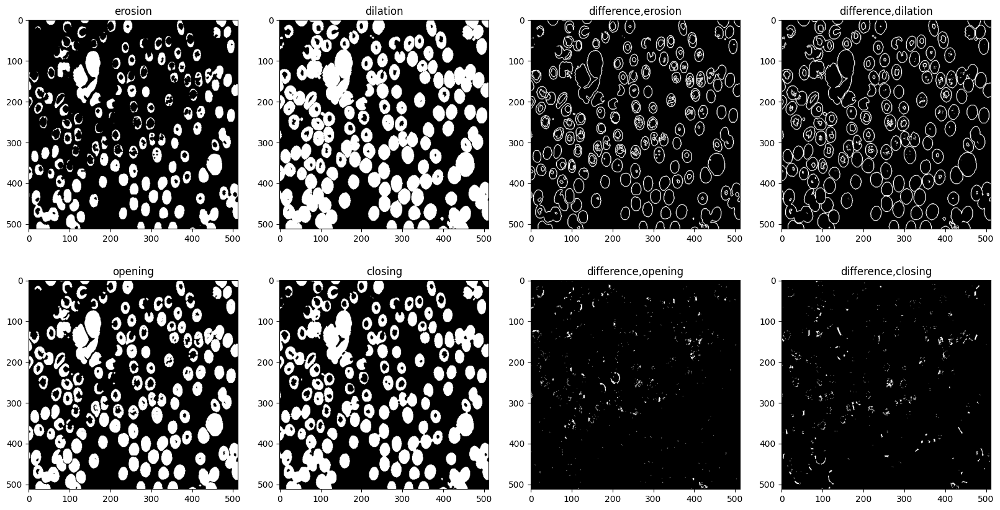

In [146]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 4, figsize=(20,10))

imgs = [morpho.erosion(image=image_binaire,footprint=strell),
        morpho.dilation(image=image_binaire,footprint=strell),
        morpho.opening(image=image_binaire,footprint=strell),
        morpho.closing(image=image_binaire,footprint=strell)]
names = ["erosion","dilation","opening","closing"]

for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i], cmap="gray")
for i in range(4):
  ax[i//2,i%2 + 2].set_title("difference," +names[i])
  ax[i//2,i%2 + 2].imshow(abs(imgs[i] - image_binaire), cmap="gray")
plt.show()


- $\textcolor{blue}{Structuring\ element\ :\ disk\ with\ raduis\ 20}$

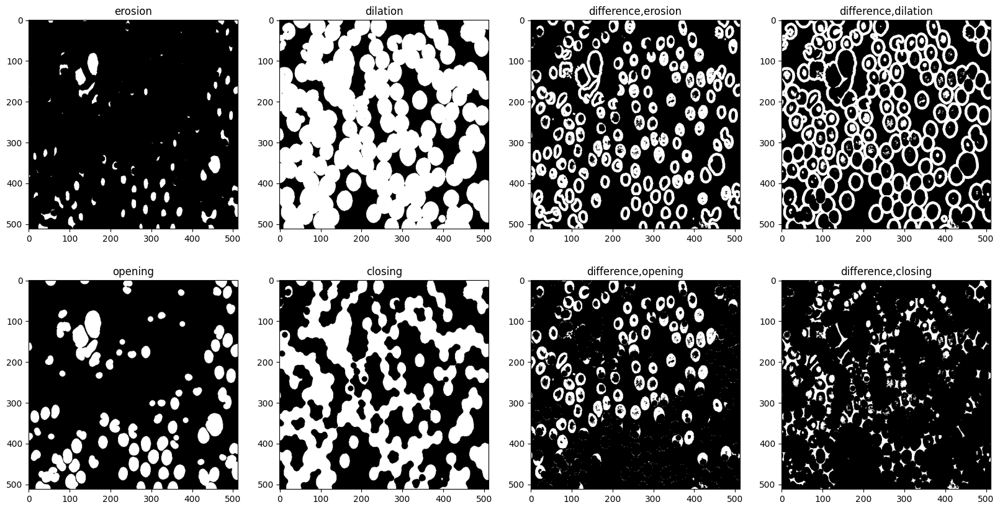

In [151]:
strell = morpho.disk(7)
fig,ax = plt.subplots(2, 4, figsize=(20,10))

imgs = [morpho.erosion(image=image_binaire,footprint=strell),
        morpho.dilation(image=image_binaire,footprint=strell),
        morpho.opening(image=image_binaire,footprint=strell),
        morpho.closing(image=image_binaire,footprint=strell)]
names = ["erosion","dilation","opening","closing"]

for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i], cmap="gray")
for i in range(4):
  ax[i//2,i%2 + 2].set_title("difference," +names[i])
  ax[i//2,i%2 + 2].imshow(abs(imgs[i] - image_binaire), cmap="gray")
plt.show()

- $\textcolor{blue}{Structuring\ element\ :\ vertical\ line\ with\ lengh\ 25}$

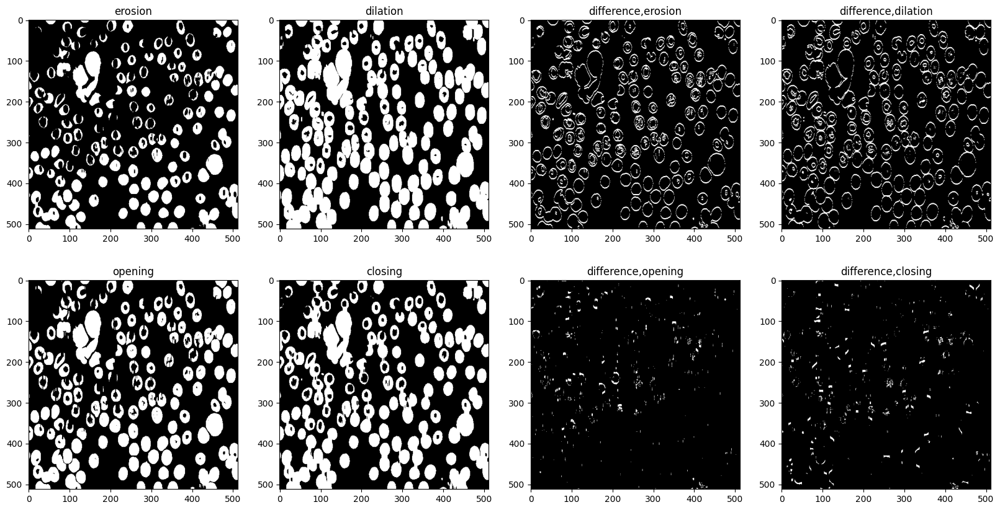

In [154]:
strell = np.ones((7, 1))
fig,ax = plt.subplots(2, 4, figsize=(20,10))

imgs = [morpho.erosion(image=image_binaire,footprint=strell),
        morpho.dilation(image=image_binaire,footprint=strell),
        morpho.opening(image=image_binaire,footprint=strell),
        morpho.closing(image=image_binaire,footprint=strell)]
names = ["erosion","dilation","opening","closing"]

for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i], cmap="gray")
for i in range(4):
  ax[i//2,i%2 + 2].set_title("difference," +names[i])
  ax[i//2,i%2 + 2].imshow(abs(imgs[i] - image_binaire), cmap="gray")
plt.show()

- $\textcolor{blue}{Structuring\ element\ :\ horizontal\ line\ with\ lengh\ 25}$

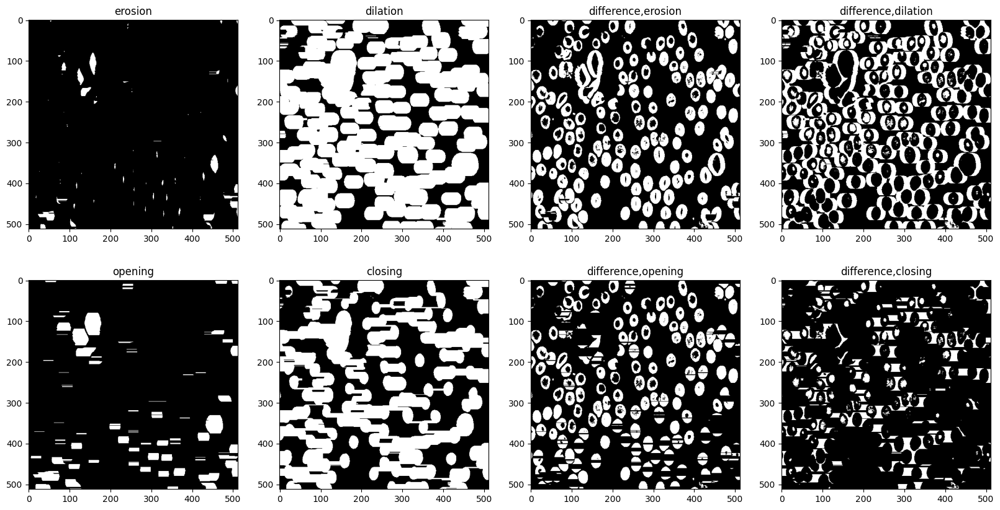

In [155]:
strell = np.ones((1, 25))
fig,ax = plt.subplots(2, 4, figsize=(20,10))

imgs = [morpho.erosion(image=image_binaire,footprint=strell),
        morpho.dilation(image=image_binaire,footprint=strell),
        morpho.opening(image=image_binaire,footprint=strell),
        morpho.closing(image=image_binaire,footprint=strell)]
names = ["erosion","dilation","opening","closing"]

for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i], cmap="gray")
for i in range(4):
  ax[i//2,i%2 + 2].set_title("difference," +names[i])
  ax[i//2,i%2 + 2].imshow(abs(imgs[i] - image_binaire), cmap="gray")

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : $\textcolor{purple}{The\ 
shape\ of\ the\ structuring\ element\ distorts\ the\ shapes\ in\ our\ image.\ This\ distortion\ reflects\ the\ structuring\ element,\ and\ the\ more\\ different\ its\ shape\ is\ from\ those\ in\ the\ image\ (line\ vs\ the\ cells\ in\ our\ case),\ the\ more\ noticeable\ the\ distortion\ is.}$
- **Q** : What is the influence of the size of the structuring element ?
- **A** : $\textcolor{purple}{The\ smaller\ the\ structuring\ element,\ the\ weaker\ or\ less\ visible\ its\ influence\ on\ the\ image.\ The\ larger\ it\ is,\ the\ more\ remarkable\ the\ effect\ is.}$

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


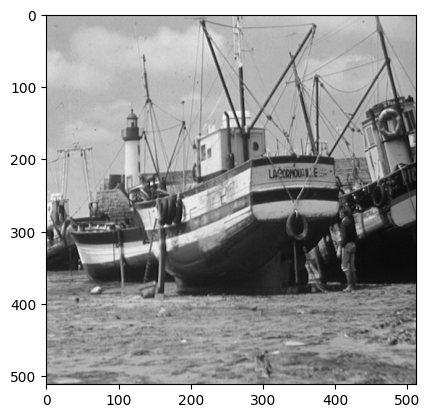

In [157]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

- $\textcolor{blue}{Structuring\ element\ :\ disk\ with\ raduis\ 2}$

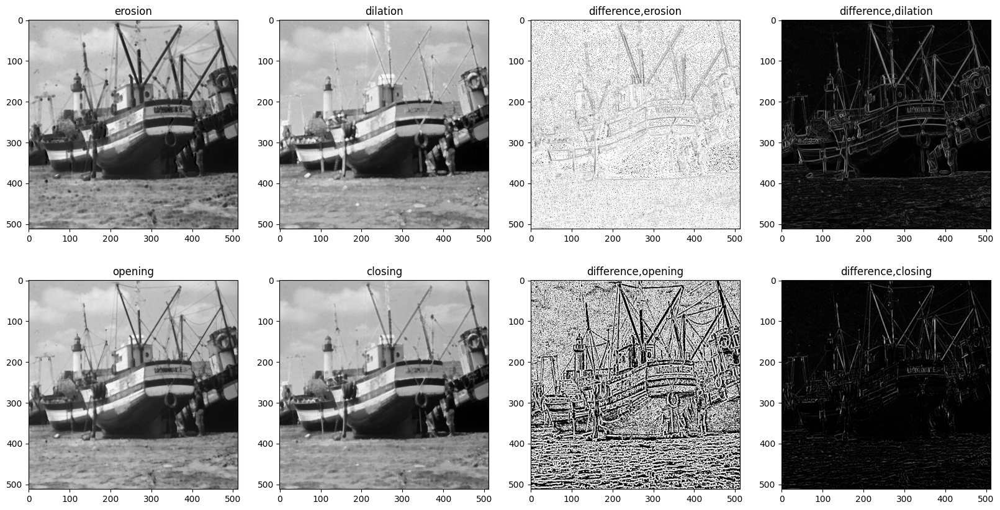

In [160]:
if student:
    strell = morpho.disk(2)
    fig,ax = plt.subplots(2, 4, figsize=(20,10))

    imgs = [morpho.erosion(image=img,footprint=strell),
            morpho.dilation(image=img,footprint=strell),
            morpho.opening(image=img,footprint=strell),
            morpho.closing(image=img,footprint=strell)]
    names = ["erosion","dilation","opening","closing"]

    for i in range(4):
        ax[i//2,i%2].set_title(names[i])
        ax[i//2,i%2].imshow(imgs[i], cmap="gray")
        ax[i//2,i%2 + 2].set_title("difference," +names[i])
        ax[i//2,i%2 + 2].imshow(abs(imgs[i] - img), cmap="gray")
    plt.show()
  

- $\textcolor{blue}{Structuring\ element\ :\ disk\ with\ raduis\ 10}$

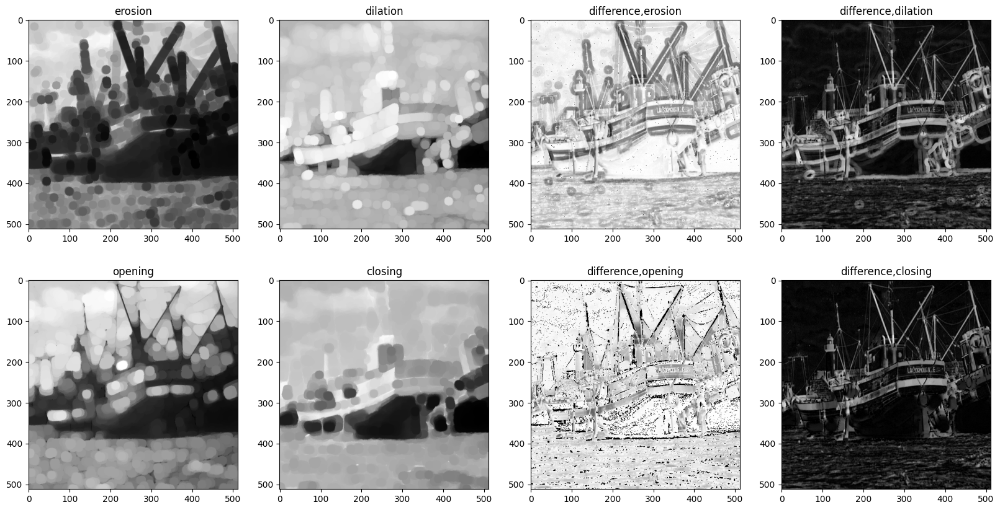

In [166]:
if student:
    strell = morpho.disk(10)
    fig,ax = plt.subplots(2, 4, figsize=(20,10))

    imgs = [morpho.erosion(image=img,footprint=strell),
            morpho.dilation(image=img,footprint=strell),
            morpho.opening(image=img,footprint=strell),
            morpho.closing(image=img,footprint=strell)]
    names = ["erosion","dilation","opening","closing"]

    for i in range(4):
        ax[i//2,i%2].set_title(names[i])
        ax[i//2,i%2].imshow(imgs[i], cmap="gray")
        ax[i//2,i%2 + 2].set_title("difference," +names[i])
        ax[i//2,i%2 + 2].imshow(abs(imgs[i] - img), cmap="gray")
    plt.show()
  

- $\textcolor{blue}{Structuring\ element\ :\ vetical\ line\ with\ lenght\ 7}$

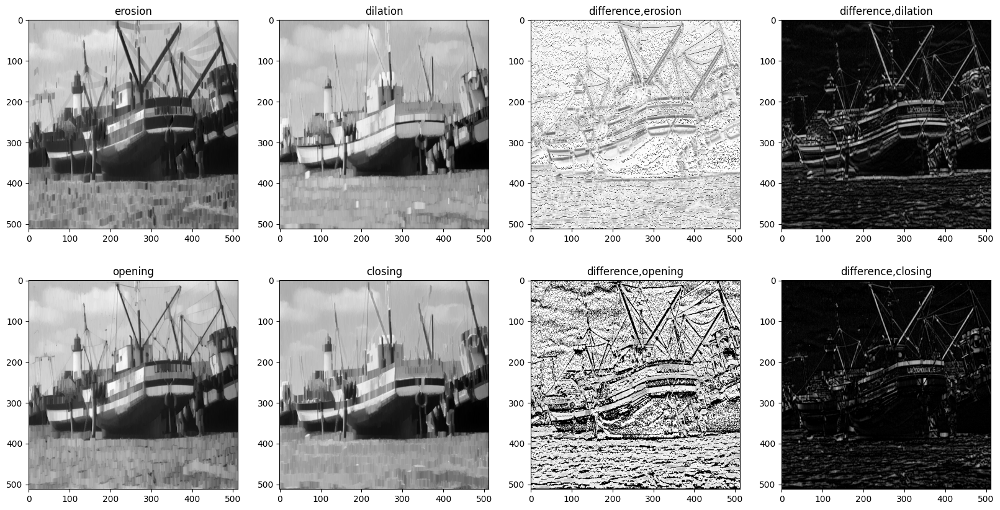

In [171]:
if student:
    strell = 255*np.ones((14,1))
    fig,ax = plt.subplots(2, 4, figsize=(20,10))

    imgs = [morpho.erosion(image=img,footprint=strell),
            morpho.dilation(image=img,footprint=strell),
            morpho.opening(image=img,footprint=strell),
            morpho.closing(image=img,footprint=strell)]
    names = ["erosion","dilation","opening","closing"]

    for i in range(4):
        ax[i//2,i%2].set_title(names[i])
        ax[i//2,i%2].imshow(imgs[i], cmap="gray")
        ax[i//2,i%2 + 2].set_title("difference," +names[i])
        ax[i//2,i%2 + 2].imshow(abs(imgs[i] - img), cmap="gray")
    plt.show()
  

- $\textcolor{blue}{Structuring\ element\ :\ horizontal line\ with\ lenght\ 15}$

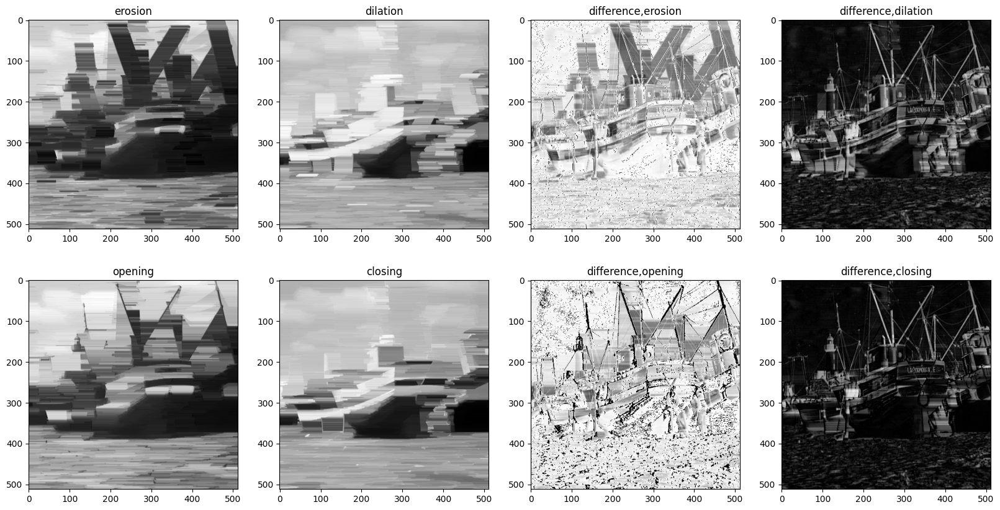

In [172]:
if student:
    strell = 255*np.ones((1, 45))
    fig,ax = plt.subplots(2, 4, figsize=(20,10))

    imgs = [morpho.erosion(image=img,footprint=strell),
            morpho.dilation(image=img,footprint=strell),
            morpho.opening(image=img,footprint=strell),
            morpho.closing(image=img,footprint=strell)]
    names = ["erosion","dilation","opening","closing"]

    for i in range(4):
        ax[i//2,i%2].set_title(names[i])
        ax[i//2,i%2].imshow(imgs[i], cmap="gray")
        ax[i//2,i%2 + 2].set_title("difference," +names[i])
        ax[i//2,i%2 + 2].imshow(abs(imgs[i] - img), cmap="gray")
    plt.show()
  

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : $\textcolor{blue}{\ Sur \ les \ images \ non \ binaires, \ la \ forme \ et \ la \ taille \ de \ l' \ element \ structurant \ comptent \ toujours. \\ En \ effet, \ plus \ cet \ element \ est \ grand \ plus \ les \ artefacts \ sont \ visibles \ sur \ l' \ images. \ et \ ces \ artifacts \ prennent \ la \ forme \ de \ l' \ element \ structurant.}$

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : $ \textcolor{purple}{The\ iterativity\ proprety\ of\ the\ dilatation\ says\ :\ D((X, Disk(2)), Disk(3)) = D(X, Disk(2) \oplus Disk(3)) = D(X, Disk(5))} \\ $

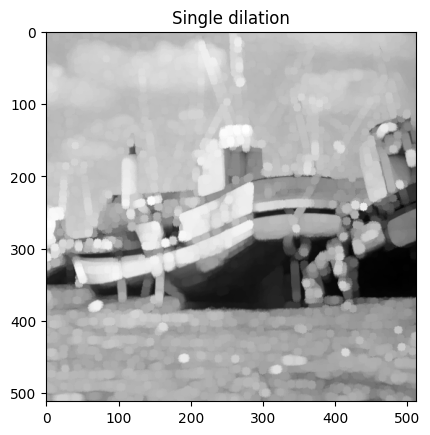

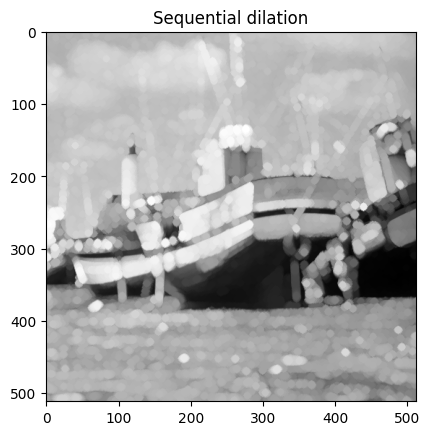

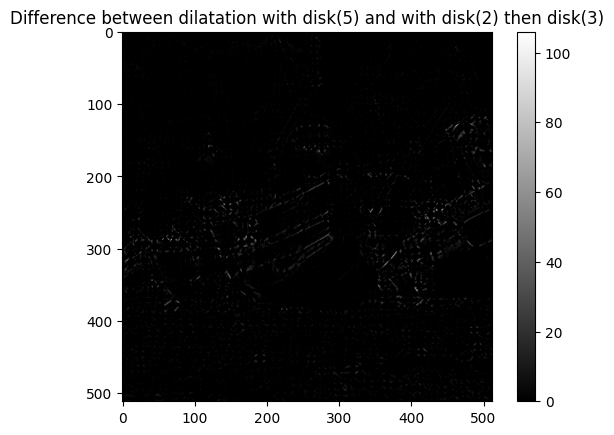

1.4993949142156864


In [185]:
if student:
  ### start code
  dilation = morpho.dilation(img,morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img, morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(abs(dilation-sequential_dilation),cmap = "gray")
  plt.title('Difference between dilatation with disk(5) and with disk(2) then disk(3)')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation))/255/512)

- $\implies$ It is noticed that the result is equivalent to saying that 1.5% of the pixels are non-zero. Therefore, $$ \textcolor{red}{D((X, Disk(2)), Disk(3)) \approx D(X, Disk(5))}$$. $\textcolor{purple}{This\ error\ is\ a\ practical\ error\ and\ it\ is\ due\ to\ the\ dicrete\ aspect\ of\ our\ images\ (quantification)}$

- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** $\textcolor{purple}{I\ think\ the\ question\ must\ be\ to\ compare\ with\ a\ sequential\ dilation\ not\ a\ sequetial\ opening.\\ After\ the\ illustration\ bellow\ we\ can\ conclude\ that\ :}$ $$ \textcolor{red}{D(X, D(disk(2), disk(3))) = D((X, Disk(2)), Disk(3))}$$

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


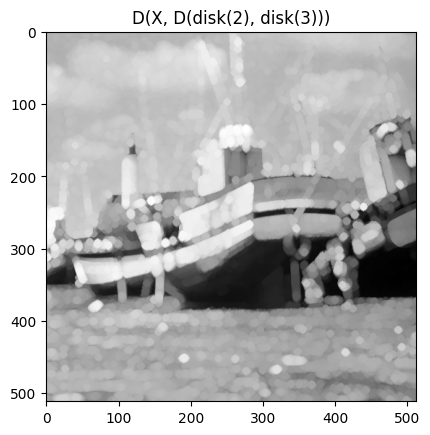

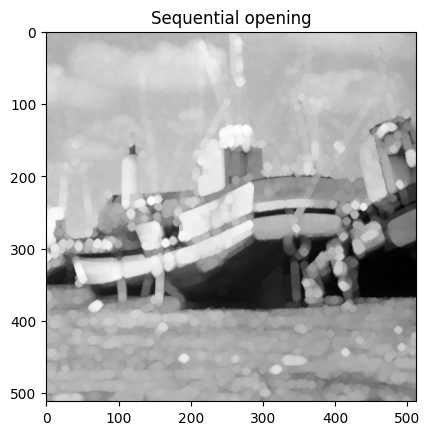

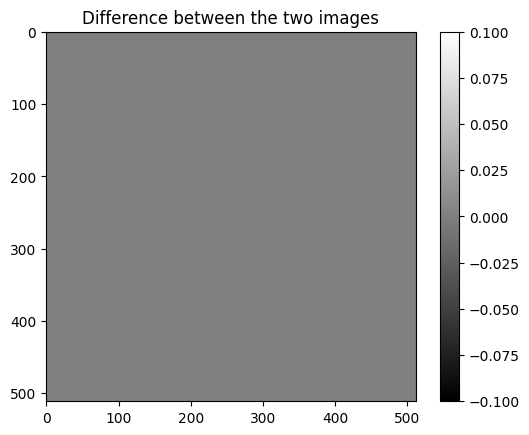

0


In [201]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell, pad_width=3, mode='constant', constant_values=0)
  sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("D(X, D(disk(2), disk(3)))")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img, morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential opening")
  plt.show()
    
  plt.imshow(abs(dilation-sequential_dilation),cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


The idempotence of closing is : $$ \textcolor{red}{(X^B)^B = X^B}$$

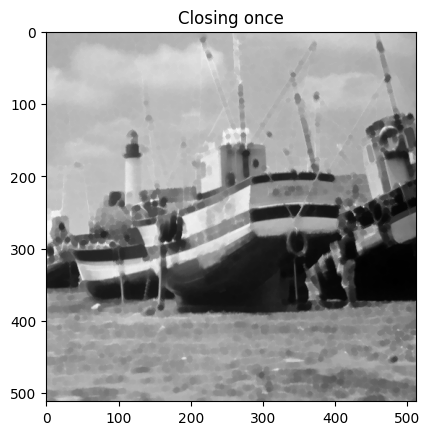

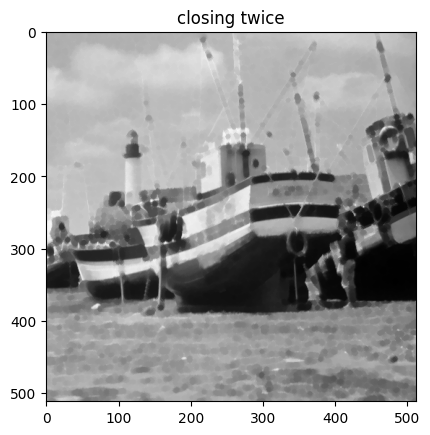

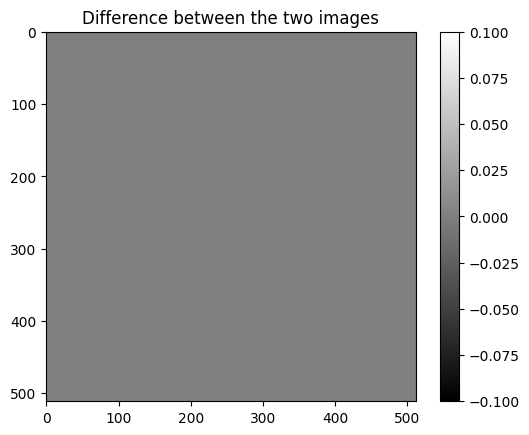

0


In [202]:
if student :
    sqr_strell = morpho.disk(3)
    # Use it to perform the image closing
    closing1 = morpho.closing(img,sqr_strell)
    plt.imshow(closing1,cmap = "gray")
    plt.title("Closing once")
    plt.show()
    
    # Compare it with closing twice
    closing2 = morpho.closing(closing1,sqr_strell)
    plt.imshow(closing2,cmap = "gray")
    plt.title("closing twice")
    plt.show()
        
    plt.imshow(abs(closing1-closing2),cmap = "gray")
    plt.title('Difference between the two images')
    plt.colorbar()
    plt.show()
    print(np.sum(np.abs(closing2-closing1)))

$Conclusion\ :\ The\ idempotence\ property\ is\ guaranteed$

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : $\textcolor{purple}{Top\ hat\ deletes\ weak\ variations\ and\ extracts\ borders\ of\ shapes\ that\ are\ in\ the\ image.\\ The\ size\ of\ the\ structuring\ element\ influences\ the\ size\ of\ the\ features\ extracted\ from\ the\ image,\ however\ the\ shape\ impacts\ the\ shape\ of\ those\ features.\\}$

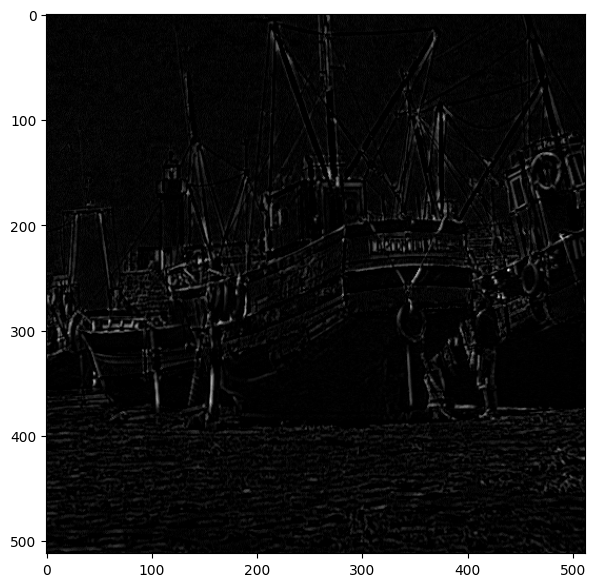

In [209]:
if student:
  ### start code
  strell = morpho.disk(2)
  top_hat =img - morpho.opening(img,strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : $\textcolor{purple}{The\ dual\ Top\ hat,\ however,\ makes\ the\ small\ shapes\ in\ the\ dark\ areas\ visible.\\ The\ size\ of\ the\ structuring\ element\ influences\ the\ size\ of\ the\ features\ extracted\ from\ the\ image,\ however\ the\ shape\ impacts\ the\ shape\ of\ those\ features.\\}$

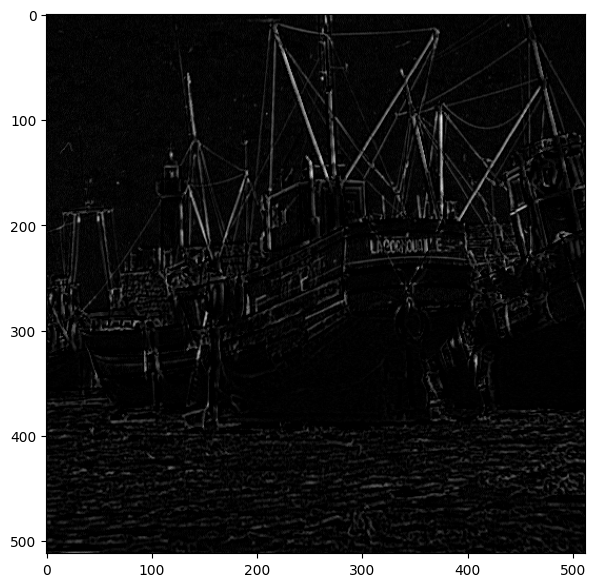

In [210]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img, strell)-img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: $\textcolor{purple}{The\ more\ we\ increase\ the\ radius\ of\ the\ square,\ the\ more\ the\ details\ and\ the\ complexity\ of\ the\ features\ in\ the\ image\ disappear.\\ So,\ we\ can\ expect\ a\ low\ pass\ filtering\ from\ alternate\ sequential\ filters.}$

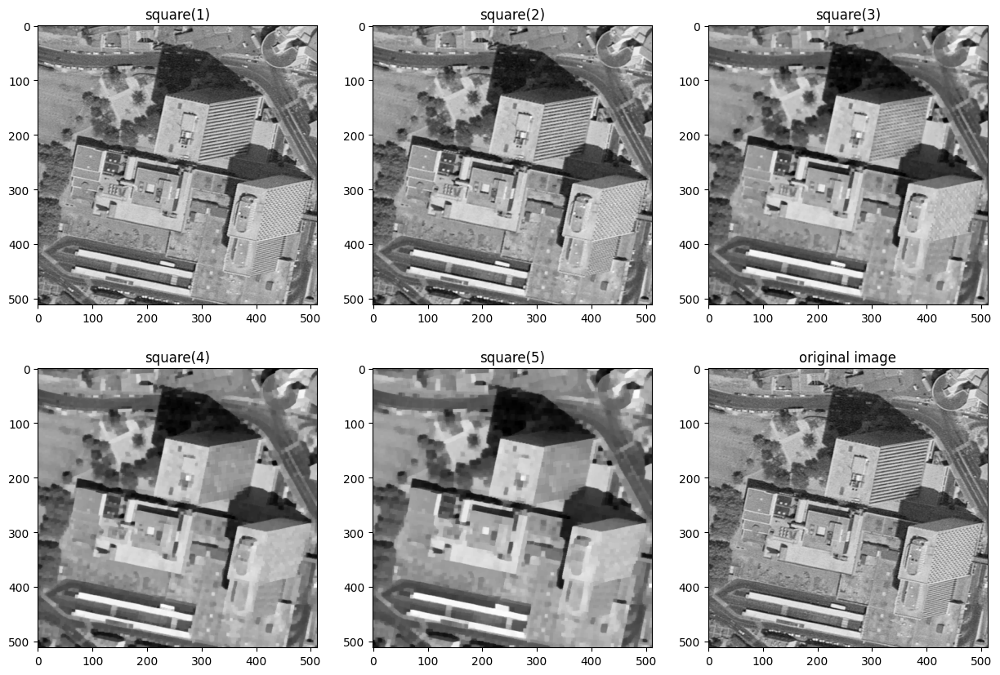

In [215]:
# Example
img = skio.imread("images/images/montreuil.tif")

# Structuring elements
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)

# Images
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(fas1,se2),se2)
fas3=morpho.closing(morpho.opening(fas2,se3),se3)
fas4=morpho.closing(morpho.opening(fas3,se4),se4)
fas5=morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (15,10))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")

ax[0, 0].set_title("square(1)")
ax[0, 1].set_title("square(2)")
ax[0, 2].set_title("square(3)")
ax[1, 0].set_title("square(4)")
ax[1, 1].set_title("square(5)")
ax[1, 2].set_title("original image")
plt.show()

#Try you own
if student :
    
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: $\textcolor{purple}{The\ morphological\ gradient\ reduces\ weak\ variations\ of\ the\ image\ and\ exposes\ areas\ where\ the\ variation\ of\ intensity\ is\ stronger.\ (Borders\ of\ cells\ are\ retained)}$

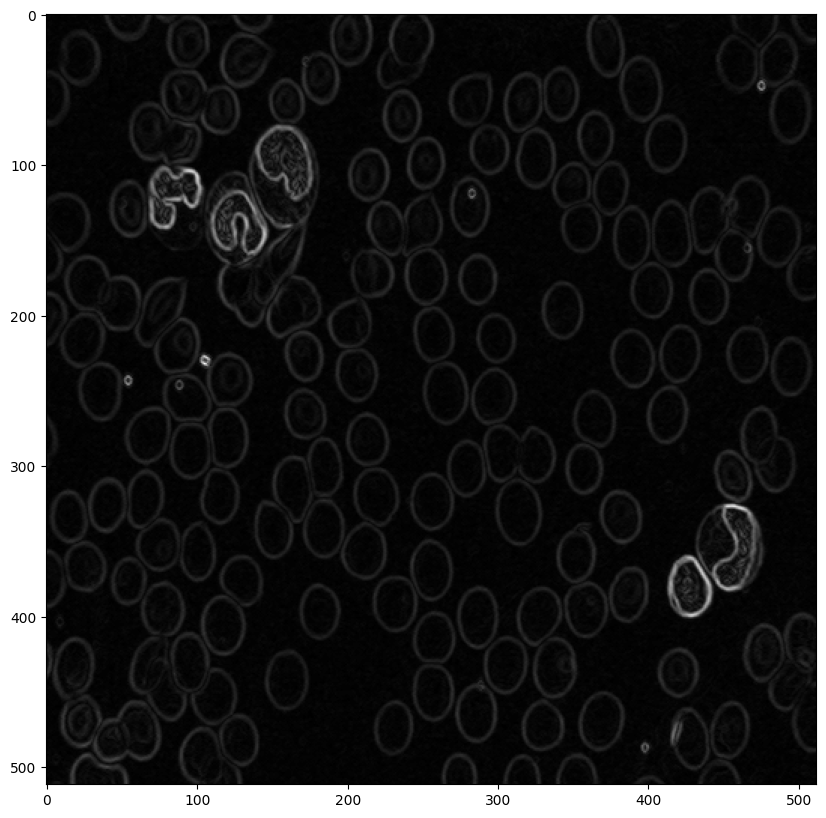

In [222]:
if student : 
  img = skio.imread("images/images/cell.tif")
  strell = morpho.disk(1)
  morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
plt.figure(figsize=(10,10))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : $\textcolor{purple}{The\ morphological\ gradient\ exposes\ the\ borders\ of\ the\ cells\ but\ also\ the\ details\ inside\ them.\\ That\ is\ due \ to\ the\ fact\ that\ the\ details\ inside\ presented\ the\ same\ strong\ variety\ of\ intensity\ (high\ frenquencies) }$

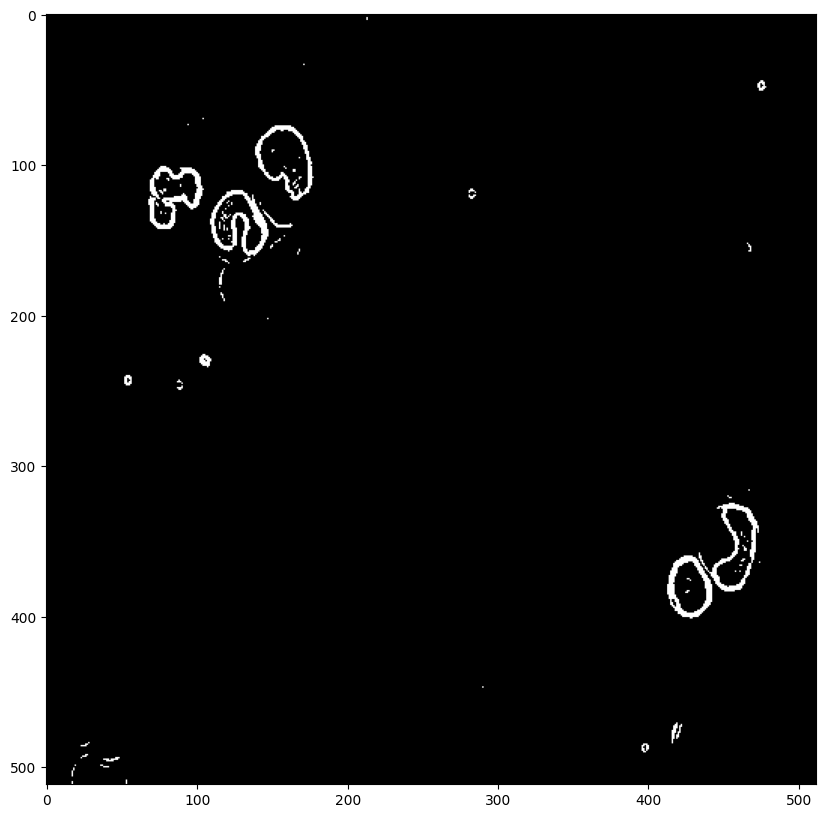

In [225]:
if student :
  thresh_grad = np.where(morpho_grad < 25, 0, 1)
plt.figure(figsize=(10,10))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

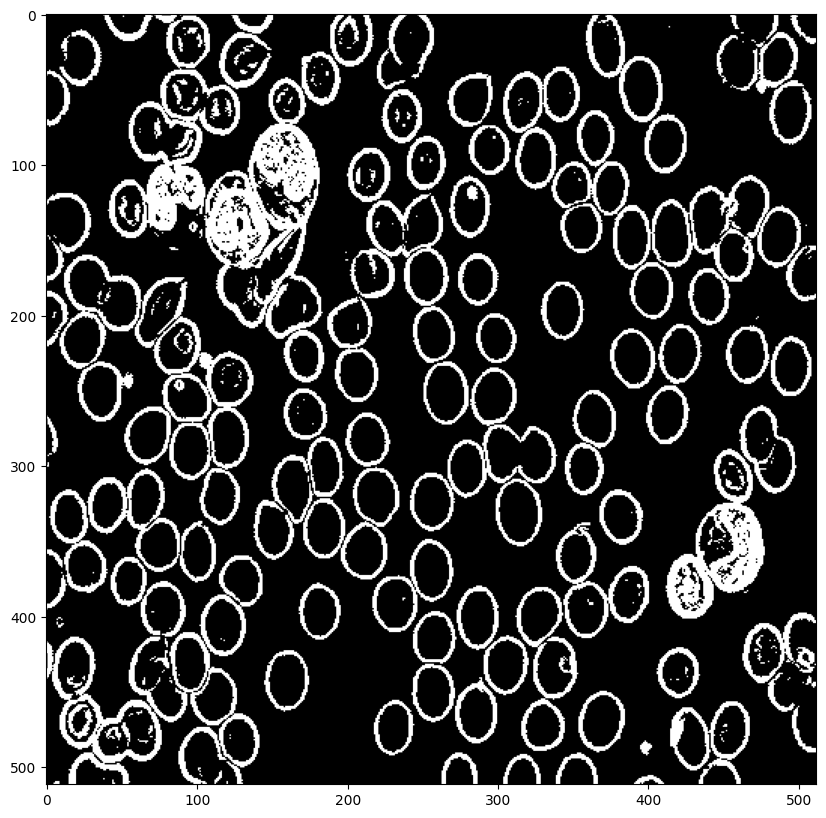

In [226]:
if student :
  thresh_grad = np.where(morpho_grad < 8, 0, 1)
plt.figure(figsize=(10,10))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :$\textcolor{purple}{We\ observe\ that\ this\ method\ do\ the\ segmentation\ with\ several\ levels\ and\ not\ only\ binary\ levels,\ so\ that\ it\ can\ help\ to\ distinguish\ the\ borders\ of\ cells\ from\ the\ features\ inside.}$
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :$\textcolor{purple}{The\ parameter\ k\ reflects\ the\ number\ of\ levels\ (or\ partitions\ of\ [0-255])\ of\ the\ tresholding\ }$

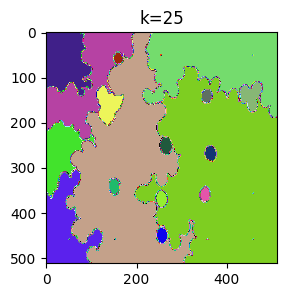

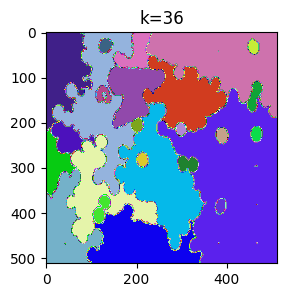

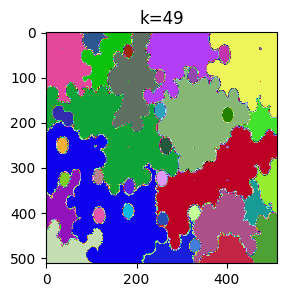

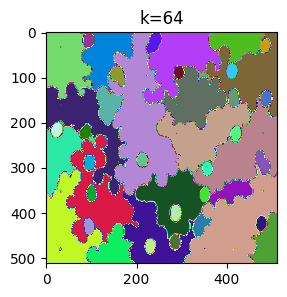

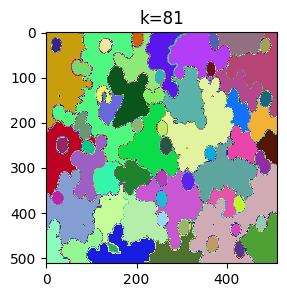

In [238]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  for i in range(5,10):
    wat = skimage.segmentation.watershed(morpho_grad, i*i)
    plt.figure(figsize=(3,3))
    plt.title(f'k={i*i}')
    plt.imshow(wat, cmap=cmaprand)

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : $\textcolor{purple}{Applying\ a\ closing\ first\ allows\ to\ the\ watershed\ to\ decide\ how\ many\ partitions\ do\ for\ the\ segemtation\ of\ the\ image.\\ Because\ we\ don't\ have\ a\ way\ to\ be\ sure\ of\ the\ k\ choosen\ if\ it\ is\ the\ right\ or\ no}$
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : $\textcolor{purple}{If\ we\ do\ not\ specify\ the\ number\ k,\ The\ opening\ gives\ to\ the\ watershed\ wrong\ indication\ on\ what\ level\ k\ should\ use\ to\ better\ result.}$

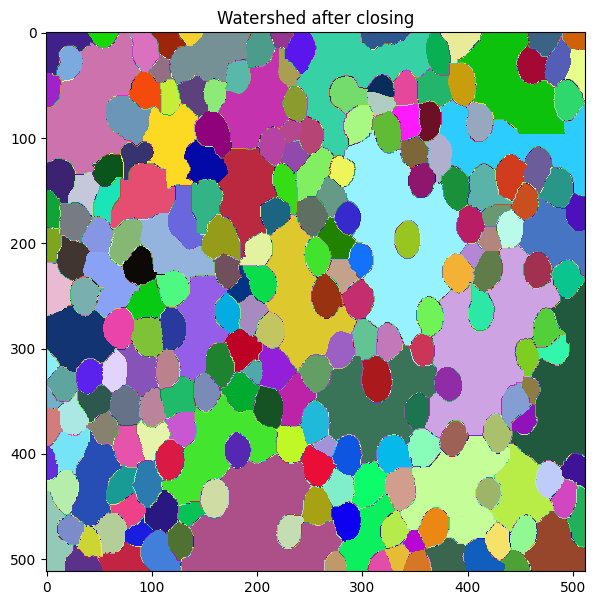

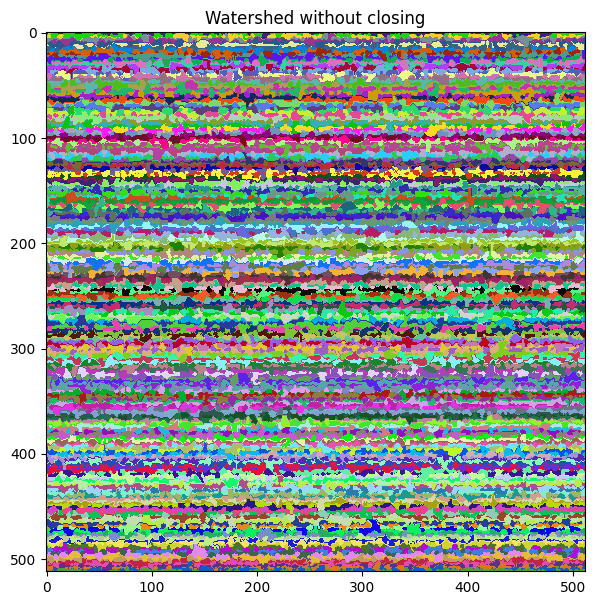

In [259]:
if student :
  wat_closing = skimage.segmentation.watershed(morpho.closing(morpho_grad, morpho.disk(7)))
  wat = skimage.segmentation.watershed(morpho_grad)
plt.figure(figsize =(7,7))
plt.title("Watershed after closing")
plt.imshow(wat_closing,cmap =cmaprand)
plt.figure(figsize =(7,7))
plt.title("Watershed without closing")
plt.imshow(wat,cmap =cmaprand)
plt.show()

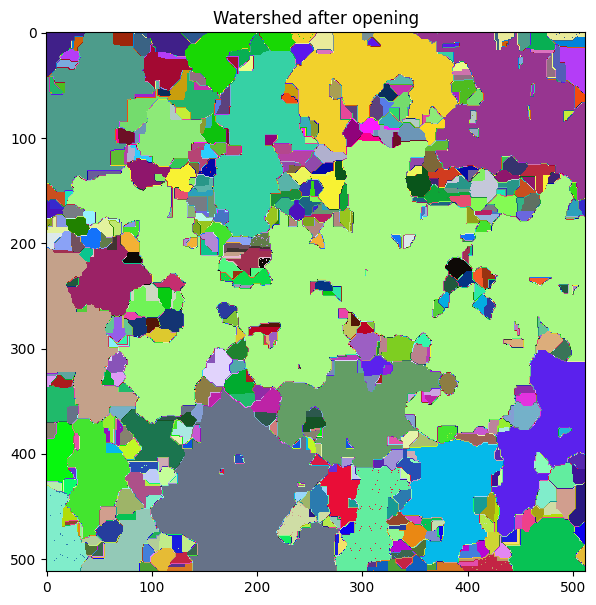

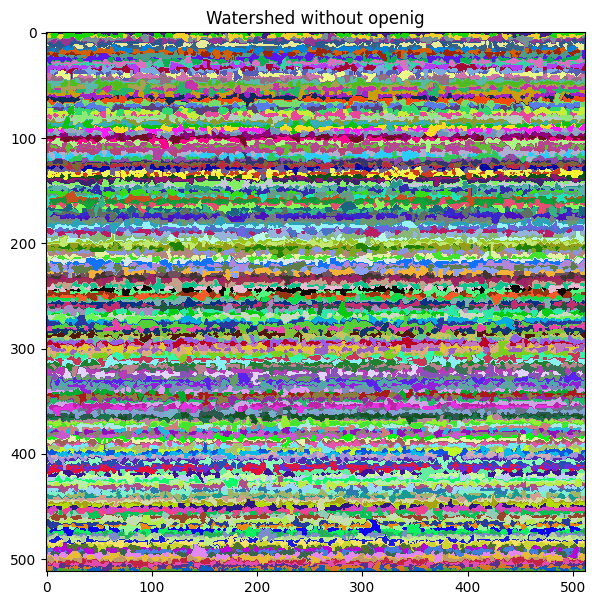

In [262]:
if student :
  wat_closing = skimage.segmentation.watershed(morpho.opening(morpho_grad, morpho.disk(7)))
  wat = skimage.segmentation.watershed(morpho_grad)
plt.figure(figsize =(7,7))
plt.title("Watershed after opening")
plt.imshow(wat_closing,cmap =cmaprand)
plt.figure(figsize =(7,7))
plt.title("Watershed without openig")
plt.imshow(wat,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : $\textcolor{purple}{We\ observe\ a\ bad\ reconstruction\ from\ the\ opening,\ so\ it\ will\ not\ help\ us\ to\ efficiently\ segment\ the\ cells.}$

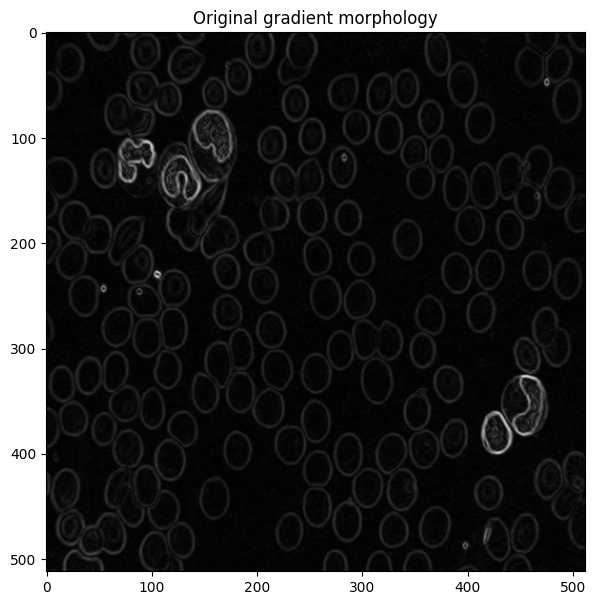

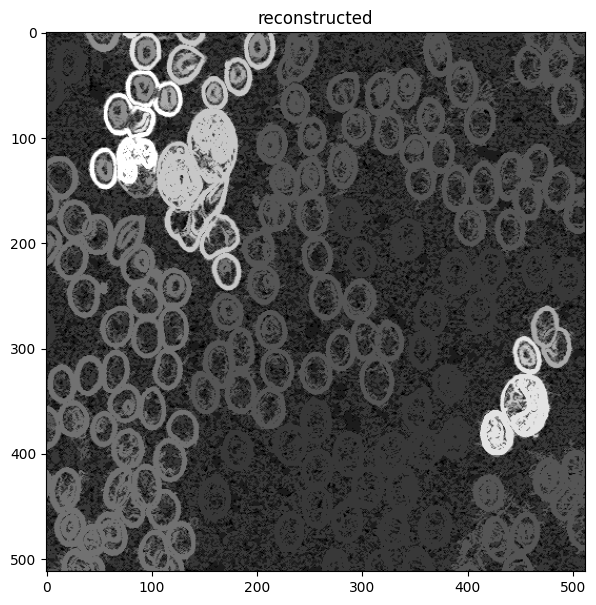

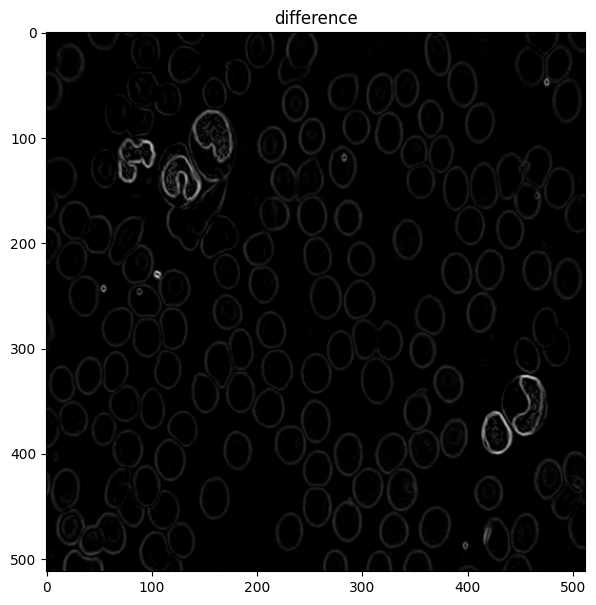

In [269]:
imOpen = morpho.opening(morpho_grad, morpho.disk(5))
reco= morpho.reconstruction(imOpen, morpho_grad, method="dilation")
plt.figure(figsize =(7,7))
plt.title("Original gradient morphology")
plt.imshow(morpho_grad,cmap ="gray")
plt.figure(figsize =(7,7))
plt.title("reconstructed")
plt.imshow(reco,cmap ="gray")
plt.figure(figsize =(7,7))
plt.title("difference")
plt.imshow(abs(reco-morpho_grad),cmap ="gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : $\textcolor{purple}{We\ observe\ a\ better\ reconstruction\ from\ the\ opening,\ so\ it\ can\ help\ us\ to\ efficiently\ segment\ the\ cells.}$

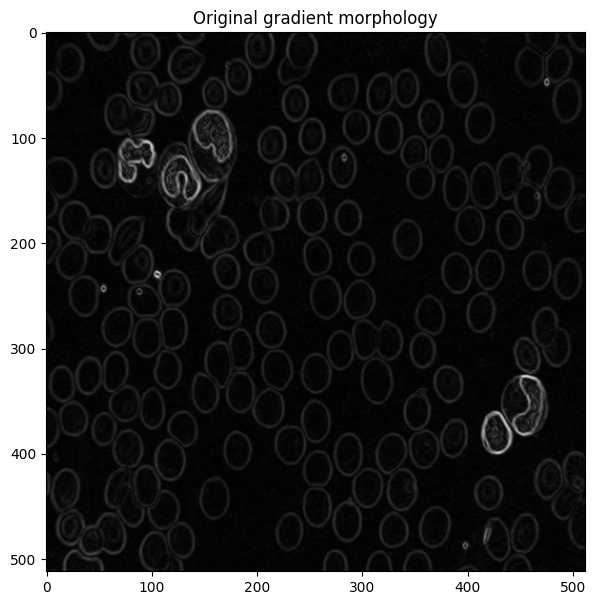

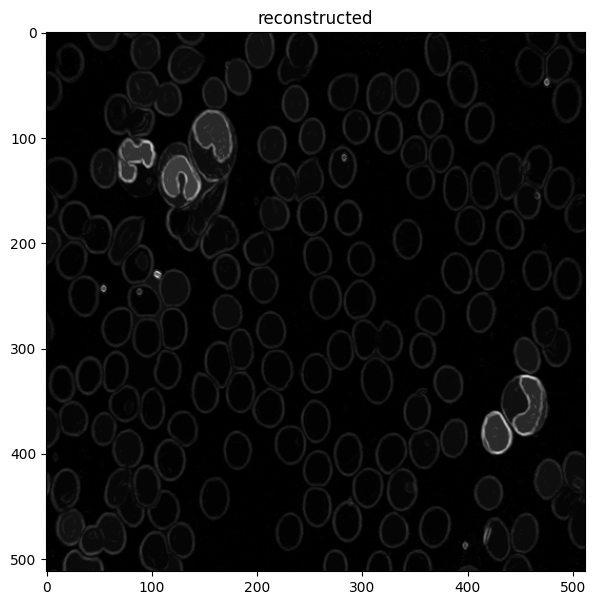

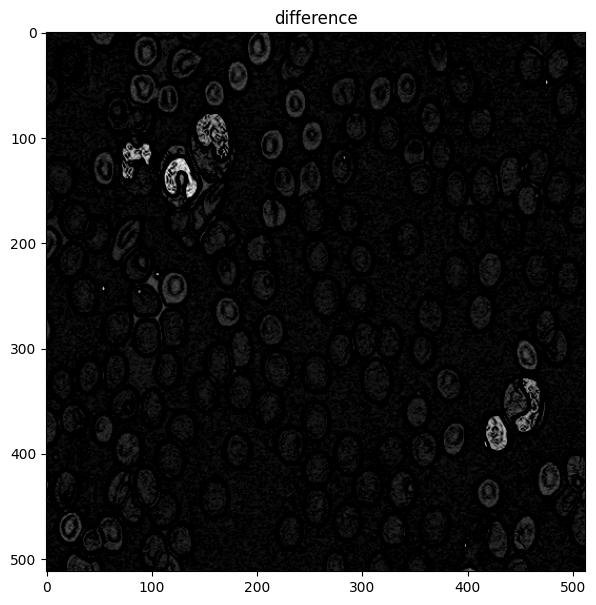

In [274]:
imClos = morpho.closing(morpho_grad, morpho.disk(5))
reco = morpho.reconstruction(imClos, morpho_grad, method='erosion')
plt.figure(figsize =(7,7))
plt.title("Original gradient morphology")
plt.imshow(morpho_grad,cmap ="gray")
plt.figure(figsize =(7,7))
plt.title("reconstructed")
plt.imshow(reco,cmap ="gray")
plt.figure(figsize =(7,7))
plt.title("difference")
plt.imshow(abs(morpho_grad - reco),cmap ="gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

In [ ]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()